# <font color='#EADCA0'><h2>Data Downloading from Kaggle</font>
After downloading the datasets from Kaggle, the code uses a function to unzip the datasets for further use in the model.
<br>
steps to download kaggle.json





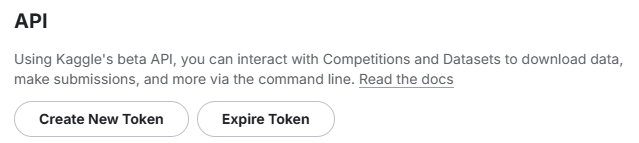

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files
files.upload()  # Upload kaggle.json file

In [ ]:
import os
os.makedirs('/root/.kaggle', exist_ok=True)
!mv kaggle.json /root/.kaggle/

In [ ]:
!kaggle datasets download -d fatmaalzhraahmed/virus-12345

In [ ]:
!unzip virus-12345.zip -d virus

# <font color='#EADCA0'><h2>IMPORT NECESSARY LIBRARIES</font>

In [ ]:
import cv2
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import Xception
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import layers
from tensorflow.keras import Model, Sequential, models
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.models import Model

# <font color='#EADCA0'><h2>VISUALIZE IMAGE DATA</font>

<font color='#EADCA1'><h3>COUNT IMAGES IN EACH CLASS</h3></font>

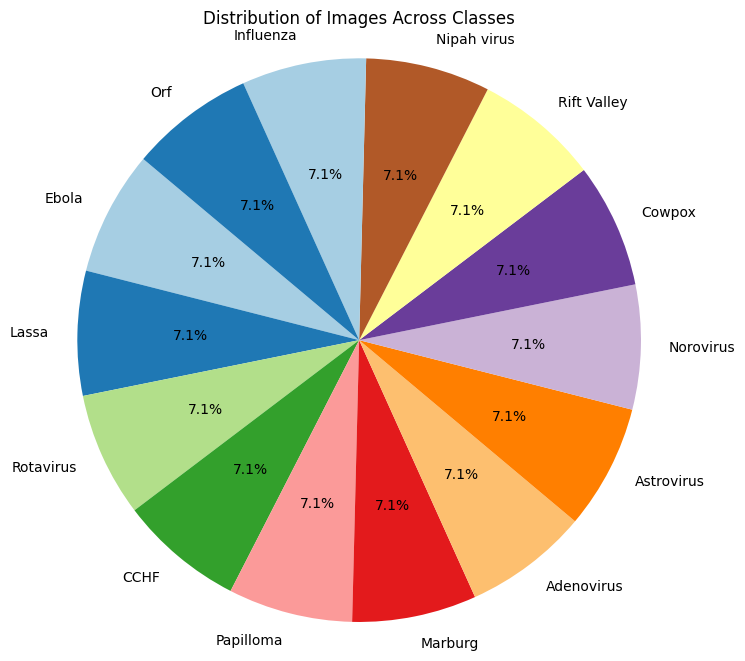

In [ ]:
def count_images_in_classes(input_folder):
    class_image_counts = {}

    for class_folder in os.listdir(input_folder):
        class_path = os.path.join(input_folder, class_folder)

        if os.path.isdir(class_path):
            tif_files = [f for f in os.listdir(class_path) if f.endswith(".tif")]

            class_image_counts[class_folder] = len(tif_files)

    return class_image_counts

# create a pie chart
def plot_pie_chart(image_counts):
    # Prepare data for pie chart
    class_names = list(image_counts.keys())
    image_counts_values = list(image_counts.values())

    plt.figure(figsize=(8, 8))
    plt.pie(image_counts_values, labels=class_names, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    plt.title('Distribution of Images Across Classes')
    plt.axis('equal')
    plt.show()

input_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"

image_counts = count_images_in_classes(input_folder)

plot_pie_chart(image_counts)


<font color='#EADCA0'><h3>COUNT TRAIN IMAGE DATA</h3></font>

In [ ]:
print("Number of images per class:")
for class_name, count in image_counts.items():
    print(f"{class_name}: {count} images")

total_images = sum(image_counts.values())
print(f"\nTotal number of images: {total_images}")

Number of images per class:
Rotavirus: 736 images
Rift Valley: 736 images
Marburg: 736 images
Nipah virus: 736 images
Papilloma: 736 images
Orf: 736 images
Adenovirus: 736 images
Influenza: 736 images
Norovirus: 736 images
CCHF: 736 images
Lassa: 736 images
Astrovirus: 736 images
Cowpox: 736 images
Ebola: 736 images

Total number of images: 10304


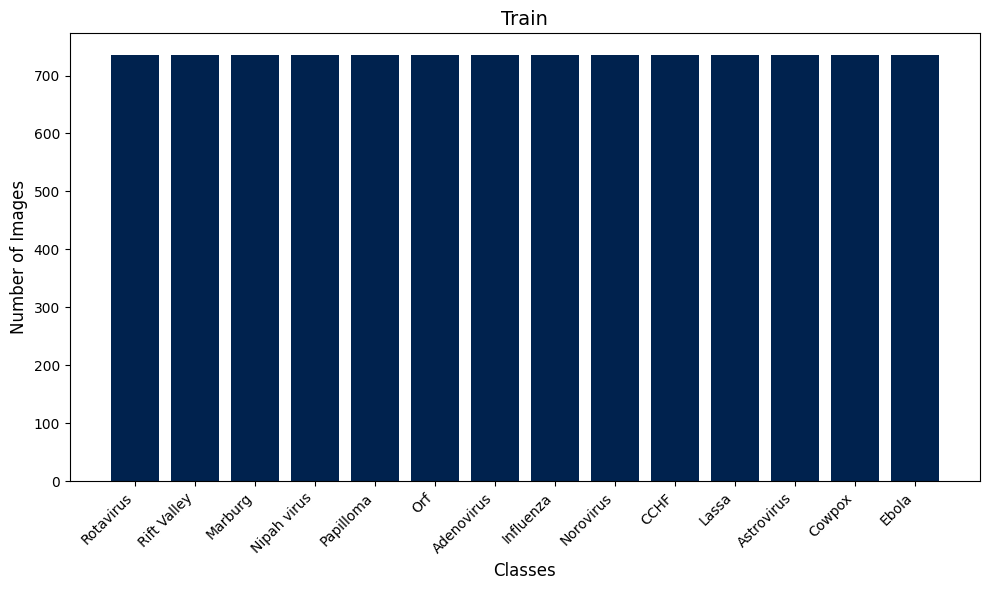

In [ ]:
def plot_bar_chart(image_counts):
    sorted_classes = sorted(image_counts.items(), key=lambda x: x[1], reverse=True)

    class_names, image_counts_values = zip(*sorted_classes)

    cmap = plt.cm.cividis
    norm = plt.Normalize(vmin=min(image_counts_values), vmax=max(image_counts_values))

    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, image_counts_values, color=cmap(norm(image_counts_values)))

    plt.title('Train', fontsize=14)
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

input_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"

image_counts = count_images_in_classes(input_folder)

plot_bar_chart(image_counts)

<font color='#EADCA0'><h2>IMAGE PREPROCESSING AND HISTOGRAM</h2></font>
##### <font color='#E1CD76'>Step 1: Apply Histogram Equalization</font>
##### <font color='#E1CD76'> Step 2: Apply smoothing (Gaussian Blur)</font>
##### <font color='#E1CD76'> Step 3: Compute the histogram after preprocessing</font>
##### <font color='#E1CD76'> Step 4: Display the histogram </font>
##### <font color='#E1CD76'> Step 5: Apply histogram-based segmentation :Use Otsu's method to find the threshold </font>
##### <font color='#E1CD76'> Step 6: Visualize results</font>


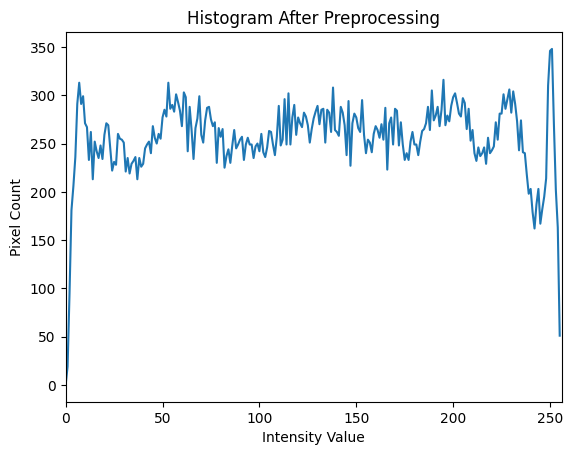

Threshold value (Otsu's method): 127.0


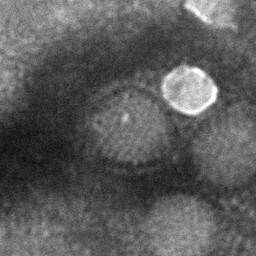

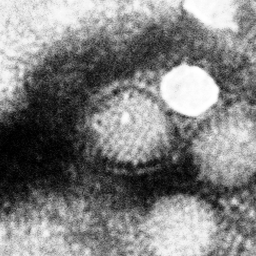

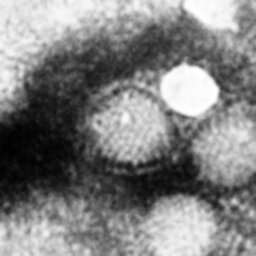

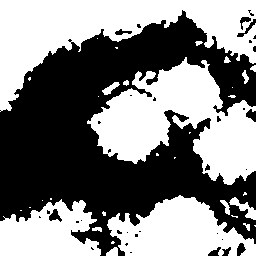

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Adenovirus/10_1.tif', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)  # (5, 5) is the kernel size

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()

_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


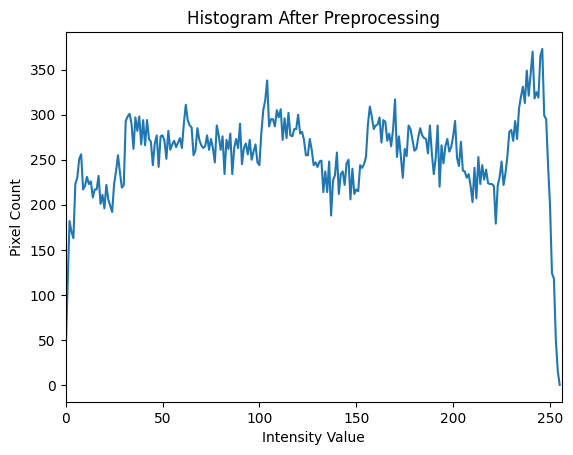

Threshold value (Otsu's method): 130.0


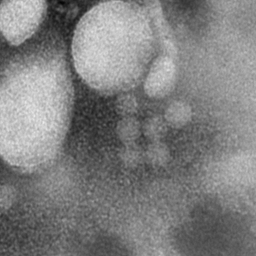

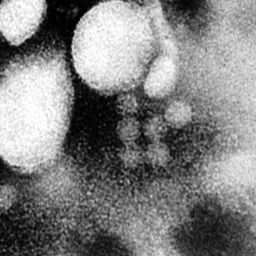

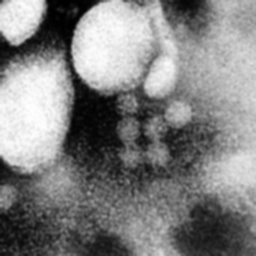

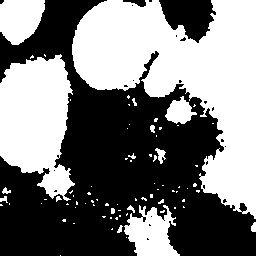

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Astrovirus/10_1.tif', cv2.IMREAD_GRAYSCALE)  # Load as grayscale

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")


cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


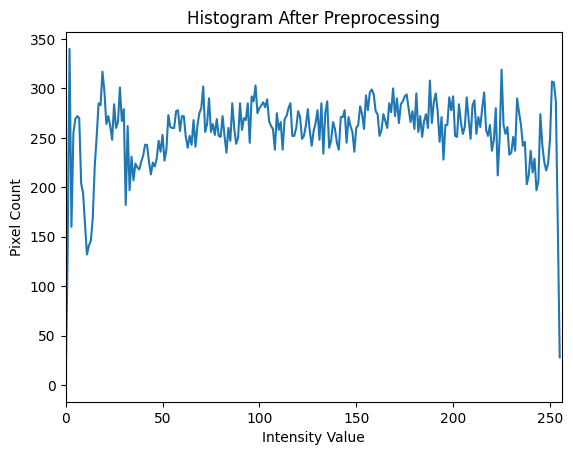

Threshold value (Otsu's method): 128.0


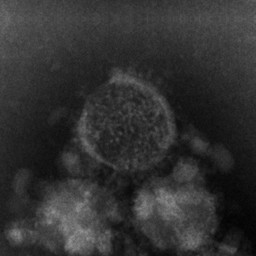

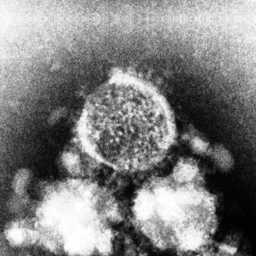

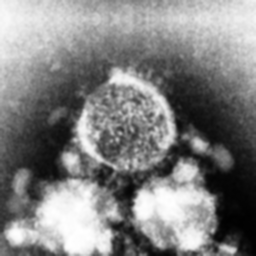

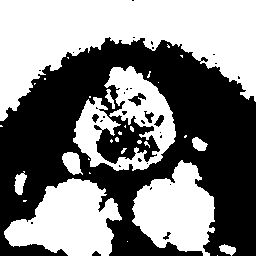

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/CCHF/10_1.tif', cv2.IMREAD_GRAYSCALE)

equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


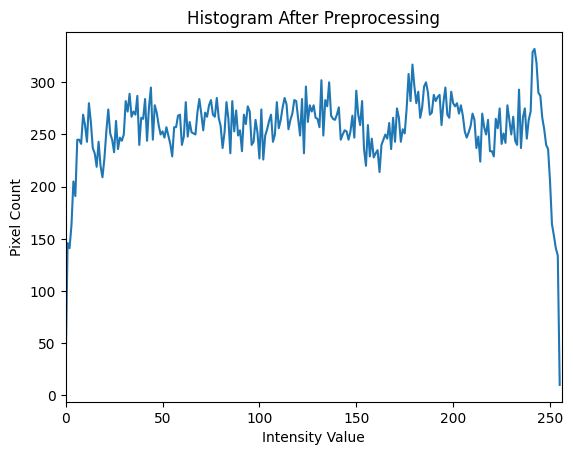

Threshold value (Otsu's method): 128.0


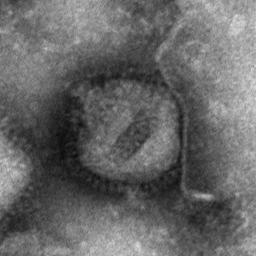

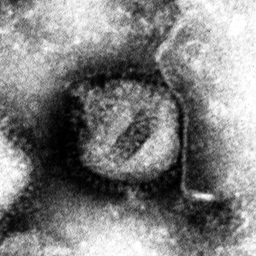

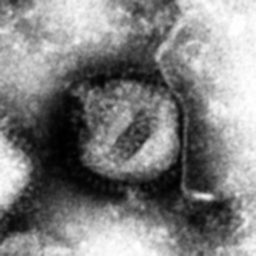

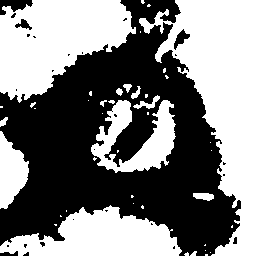

In [ ]:
image = cv2.imread('/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation/Influenza/10_2.tif', cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(image)

smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)

hist = cv2.calcHist([smoothed_image], [0], None, [256], [0, 256])

plt.figure()
plt.title("Histogram After Preprocessing")
plt.xlabel("Intensity Value")
plt.ylabel("Pixel Count")
plt.plot(hist)
plt.xlim([0, 256])
plt.show()


_, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(f"Threshold value (Otsu's method): {_}")

cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(smoothed_image)
cv2_imshow(segmented_image)


<font color='#EADCA0'><h2>Steps for Balancing Data</h2></font>
###### <font color='#E1CD76'>
1.Shuffle and Resample: We can shuffle the data and resample the classes to either oversample the underrepresented classes or undersample the overrepresented ones.
</font>
###### <font color='#E1CD76'>
2.Stratified Splitting: This ensures that the proportion of each class in the training, validation, and test sets is kept consistent.
</font>



In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train"
destination_folder = "/content/all"

shutil.copytree(source_folder, destination_folder)

print(f"Folder copied from {source_folder} to {destination_folder}")


Folder copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/augmented_train to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/validation"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/validation to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/test"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/test to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_1nm_256x256/train"
destination_folder = "/content/all"

for item in os.listdir(source_folder):
    source_item = os.path.join(source_folder, item)
    destination_item = os.path.join(destination_folder, item)

    if os.path.isdir(source_item):
        shutil.copytree(source_item, destination_item, dirs_exist_ok=True)
    else:
        shutil.copy2(source_item, destination_item)

print(f"Files have been copied from {source_folder} to {destination_folder}")


Files have been copied from /content/virus/TEM virus dataset/context_virus_1nm_256x256/train to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/test"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/train"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
source_folder = "/content/virus/TEM virus dataset/context_virus_RAW/validation"
destination_folder = "/content/all"

folders_to_copy = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

os.makedirs(destination_folder, exist_ok=True)

for folder_name in folders_to_copy:
    source_item = os.path.join(source_folder, folder_name)
    destination_item = os.path.join(destination_folder, folder_name)

    if os.path.exists(source_item):
        os.makedirs(destination_item, exist_ok=True)
        for item in os.listdir(source_item):
            source_path = os.path.join(source_item, item)
            destination_path = os.path.join(destination_item, item)

            if os.path.isdir(source_path):
                shutil.copytree(source_path, destination_path, dirs_exist_ok=True)
            else:
                shutil.copy2(source_path, destination_path)

        print(f"Copied: {folder_name} to {destination_item}")
    else:
        print(f"Folder not found: {folder_name}")

print(f"Selected folders have been copied to {destination_folder}")


Copied: Rotavirus to /content/all/Rotavirus
Copied: Papilloma to /content/all/Papilloma
Copied: Influenza to /content/all/Influenza
Copied: Adenovirus to /content/all/Adenovirus
Copied: Lassa to /content/all/Lassa
Copied: Orf to /content/all/Orf
Copied: CCHF to /content/all/CCHF
Copied: Astrovirus to /content/all/Astrovirus
Copied: Cowpox to /content/all/Cowpox
Copied: Norovirus to /content/all/Norovirus
Copied: Nipah virus to /content/all/Nipah virus
Copied: Marburg to /content/all/Marburg
Copied: Rift Valley to /content/all/Rift Valley
Copied: Ebola to /content/all/Ebola
Selected folders have been copied to /content/all


In [ ]:
folder_path = "/content/all/_EXCLUDED"

if os.path.exists(folder_path):
    shutil.rmtree(folder_path)
    print(f"Folder '{folder_path}' and all its contents have been removed.")
else:
    print(f"Folder '{folder_path}' does not exist.")


Folder '/content/all/_EXCLUDED' and all its contents have been removed.


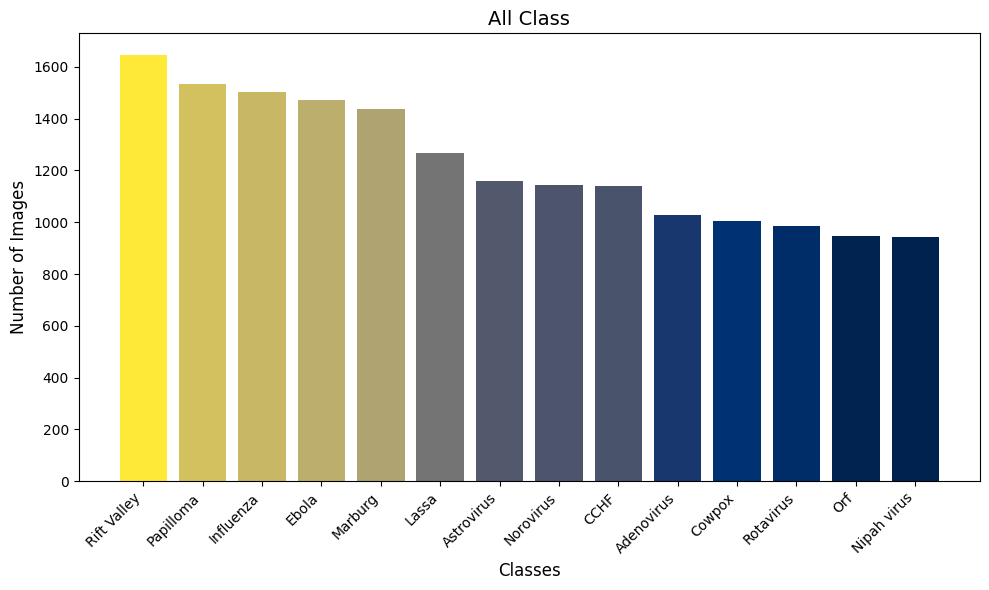

In [ ]:
def plot_bar_chart(image_counts):
    sorted_classes = sorted(image_counts.items(), key=lambda x: x[1], reverse=True)

    class_names, image_counts_values = zip(*sorted_classes)

    cmap = plt.cm.cividis
    norm = plt.Normalize(vmin=min(image_counts_values), vmax=max(image_counts_values))

    plt.figure(figsize=(10, 6))
    bars = plt.bar(class_names, image_counts_values, color=cmap(norm(image_counts_values)))

    plt.title('All Class', fontsize=14)
    plt.xlabel('Classes', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

input_folder = "/content/all"

image_counts = count_images_in_classes(input_folder)
plot_bar_chart(image_counts)

<font color='#EADCA0'><h2>RESPLITING DATASET INTO TRAIN, VALIDATION, AND TEST SETS</h2></font>
###### <font color='#E1CD76'>Split the data (60% train, 20% val, 20% test)</font>


In [ ]:
output_dir = '/content/all'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

for class_name in class_names:
    class_dir = os.path.join(output_dir, class_name)

    if os.path.exists(class_dir):
        num_images = len(os.listdir(class_dir))
        print(f"{class_name}: {num_images} images")
    else:
        print(f"Directory not found: {class_dir}")


Rotavirus: 988 images
Papilloma: 1537 images
Influenza: 1507 images
Adenovirus: 1032 images
Lassa: 1271 images
Orf: 950 images
CCHF: 1143 images
Astrovirus: 1163 images
Cowpox: 1008 images
Norovirus: 1147 images
Nipah virus: 945 images
Marburg: 1442 images
Rift Valley: 1650 images
Ebola: 1476 images


In [ ]:
base_dir = '/content/all'
train_dir = '/content/process/train'
val_dir = '/content/process/val'
test_dir = '/content/process/test'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

random_state = 58
random.seed(random_state)

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

for class_name in class_names:
    class_dir = os.path.join(base_dir, class_name)

    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

    images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]
    random.shuffle(images)
    num_images = len(images)
    train_size = int(0.6 * num_images)
    val_size = int(0.2 * num_images)

    train_images = images[:train_size]
    val_images = images[train_size:train_size + val_size]
    test_images = images[train_size + val_size:]

    # Move images to class directories
    for img_name in train_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(train_dir, class_name, img_name))
    for img_name in val_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(val_dir, class_name, img_name))
    for img_name in test_images:
        shutil.copy(os.path.join(class_dir, img_name), os.path.join(test_dir, class_name, img_name))



<ipython-input-50-ca316e48e50c>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='class', y='count', data=sorted_df, palette='viridis')  # Create the bar plot


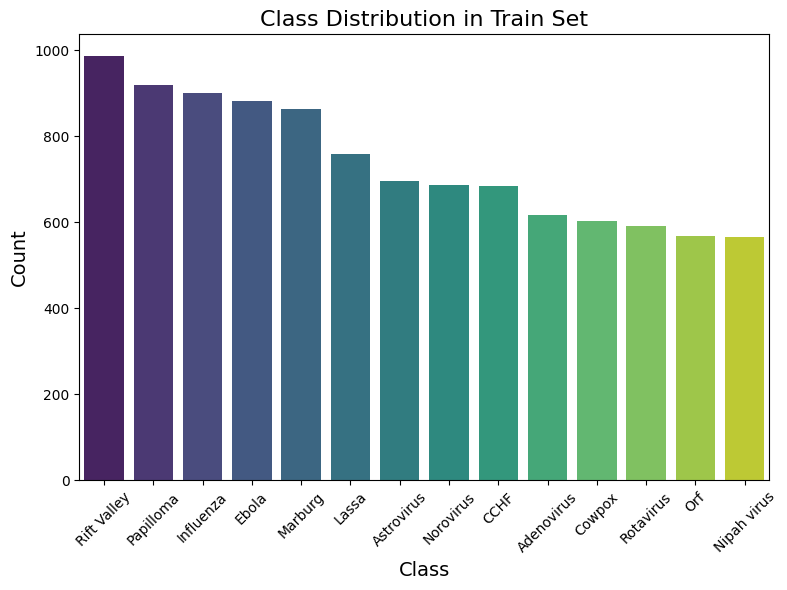

In [ ]:
train_dir = '/content/process/train'

categories =[
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]


train_labels = []

for category in categories:
    category_path = os.path.join(train_dir, category)
    num_files = len(os.listdir(category_path))

    train_labels += [category] * num_files

df = pd.DataFrame({'class': train_labels})

class_counts = df['class'].value_counts().sort_values(ascending=False)

sorted_df = pd.DataFrame({'class': class_counts.index, 'count': class_counts.values})

plt.figure(figsize=(8, 6))
sns.barplot(x='class', y='count', data=sorted_df, palette='viridis')
plt.title('Class Distribution in Train Set', fontsize=16)
plt.xlabel('Class', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


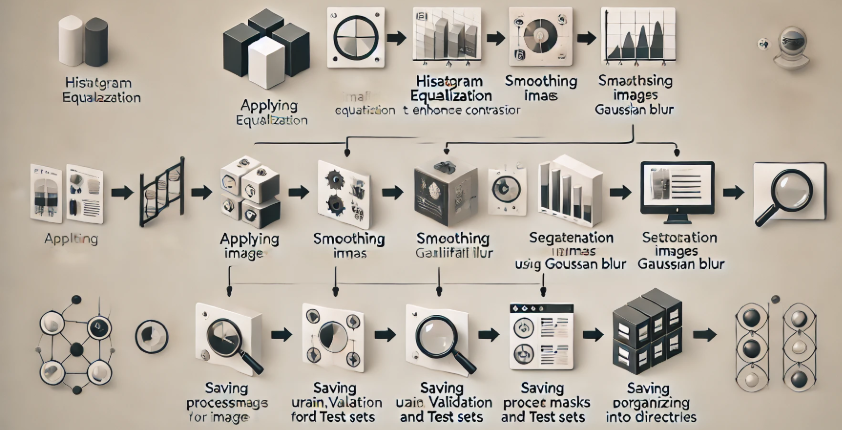
<font color='#EADCA0'><h2>Image Processing Pipeline:</h2></font>
###### <font color='#E1CD76'>
1.Applying Histogram Equalization to Enhance Image Contrast<br>
2.Smoothing Images Using Gaussian Blur<br>
3.Segmentation Using Otsu's Method for Mask Creation<br>
4.Saving Processed Masks for Train, Validation, and Test Sets<br>
5.Processing and Organizing Masked Images into Directories<br>
</font>

In [ ]:
train_dir = '/content/process/train'
val_dir = '/content/process/val'
test_dir = '/content/process/test'

processed_train_dir = '/content/proces/train'
processed_val_dir = '/content/proces/val'
processed_test_dir = '/content/proces/test'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

def apply_mask(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error loading image: {image_path}")
        return None

    equalized_image = cv2.equalizeHist(image)
    smoothed_image = cv2.GaussianBlur(equalized_image, (5, 5), 0)
    _, segmented_image = cv2.threshold(smoothed_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return segmented_image

os.makedirs(processed_train_dir, exist_ok=True)
os.makedirs(processed_val_dir, exist_ok=True)
os.makedirs(processed_test_dir, exist_ok=True)

for class_name in class_names:
    class_train_dir = os.path.join(train_dir, class_name)
    class_val_dir = os.path.join(val_dir, class_name)
    class_test_dir = os.path.join(test_dir, class_name)
    processed_class_train_dir = os.path.join(processed_train_dir, class_name)
    processed_class_val_dir = os.path.join(processed_val_dir, class_name)
    processed_class_test_dir = os.path.join(processed_test_dir, class_name)

    os.makedirs(processed_class_train_dir, exist_ok=True)
    os.makedirs(processed_class_val_dir, exist_ok=True)
    os.makedirs(processed_class_test_dir, exist_ok=True)

    for img_name in os.listdir(class_train_dir):
        image_path = os.path.join(class_train_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_train_dir, img_name)
            cv2.imwrite(mask_save_path, mask)
    for img_name in os.listdir(class_val_dir):
        image_path = os.path.join(class_val_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_val_dir, img_name)
            cv2.imwrite(mask_save_path, mask)

    for img_name in os.listdir(class_test_dir):
        image_path = os.path.join(class_test_dir, img_name)
        mask = apply_mask(image_path)
        if mask is not None:
            mask_save_path = os.path.join(processed_class_test_dir, img_name)
            cv2.imwrite(mask_save_path, mask)

print("Mask processing applied and masks saved in the processed folders.")


Mask processing applied and masks saved in the processed folders.


<font color='#EADCA0'><h2>Display Images From Each Class</h2></font>


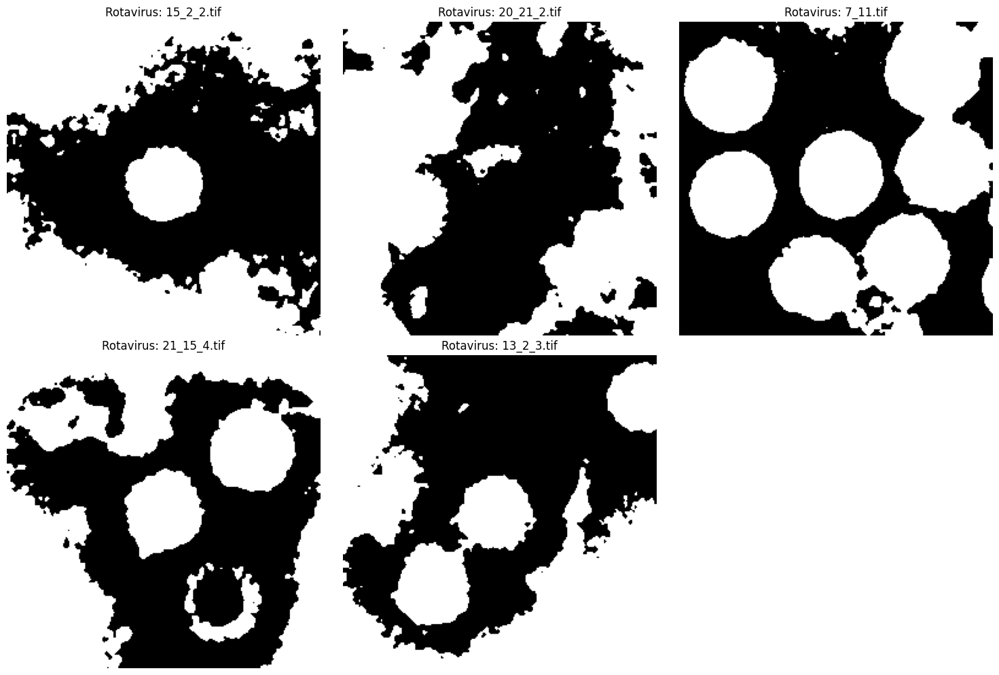

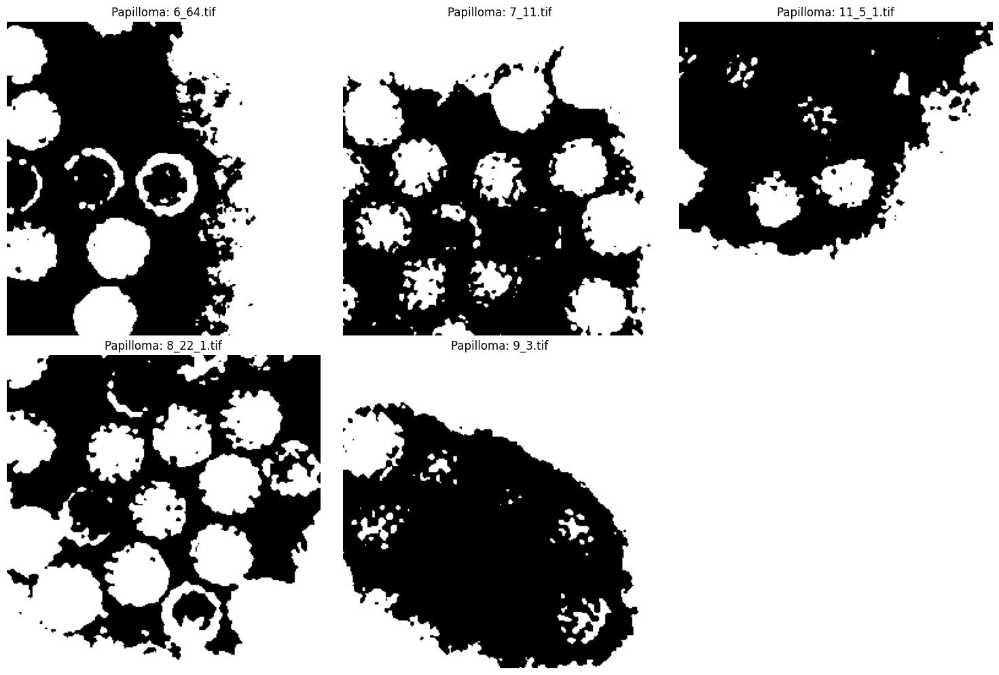

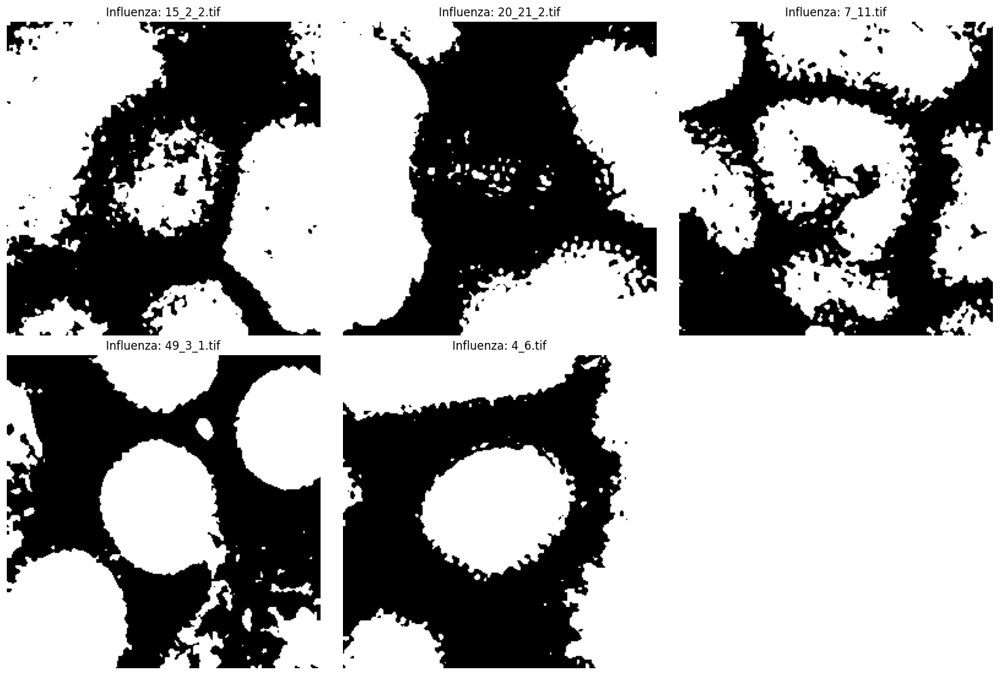

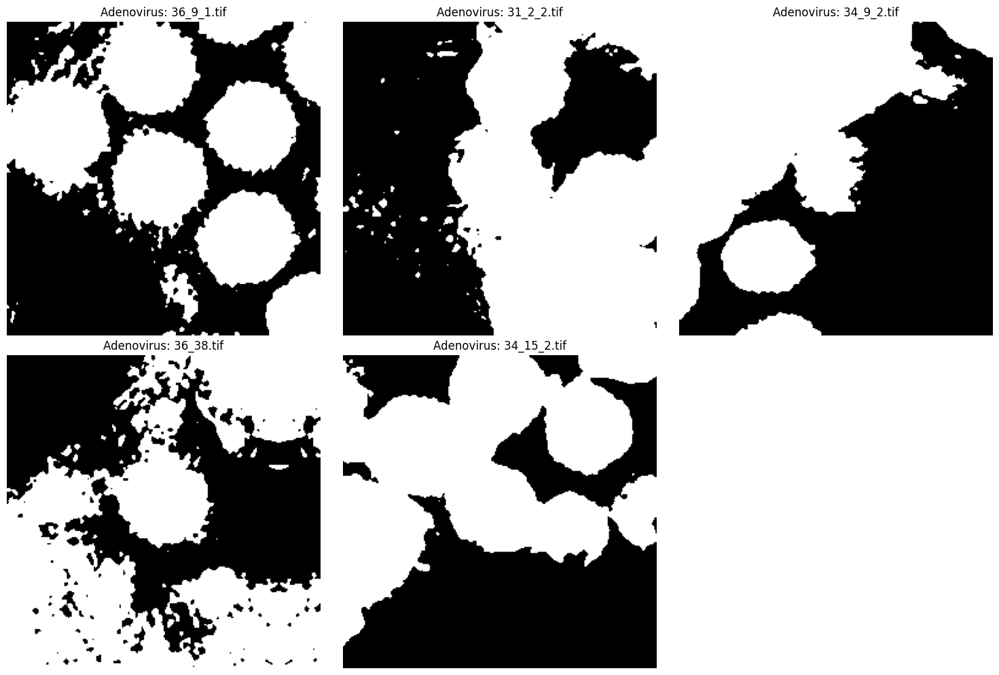

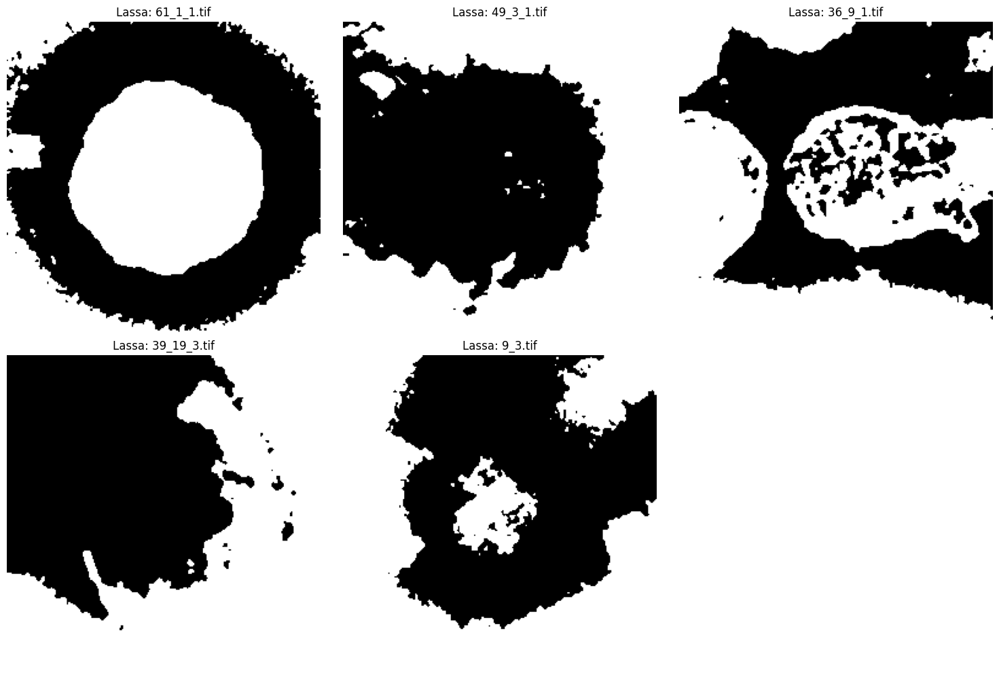

...

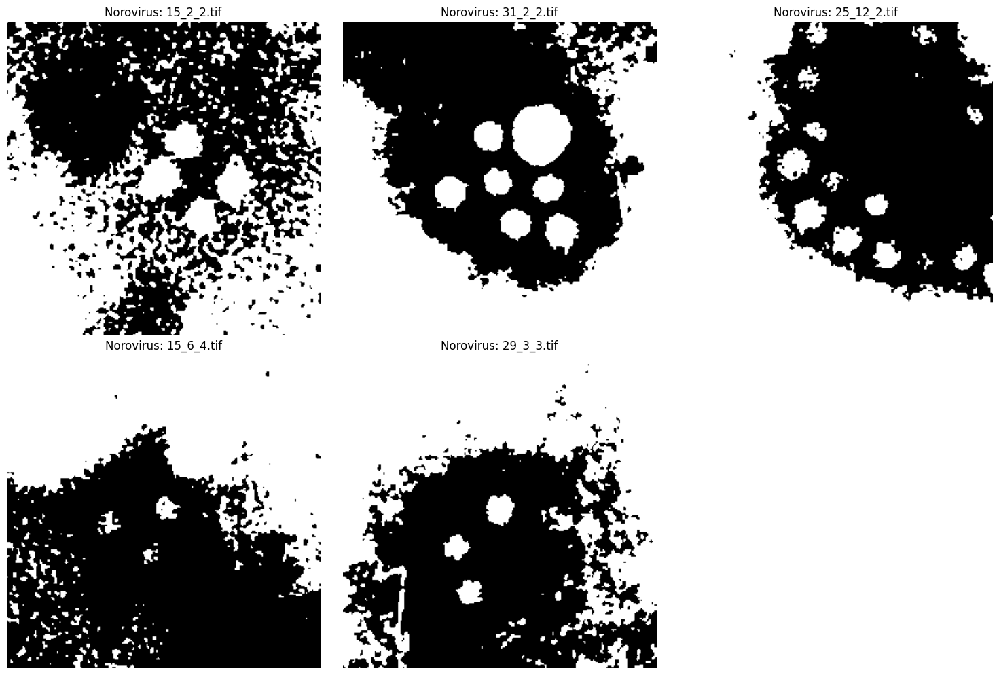

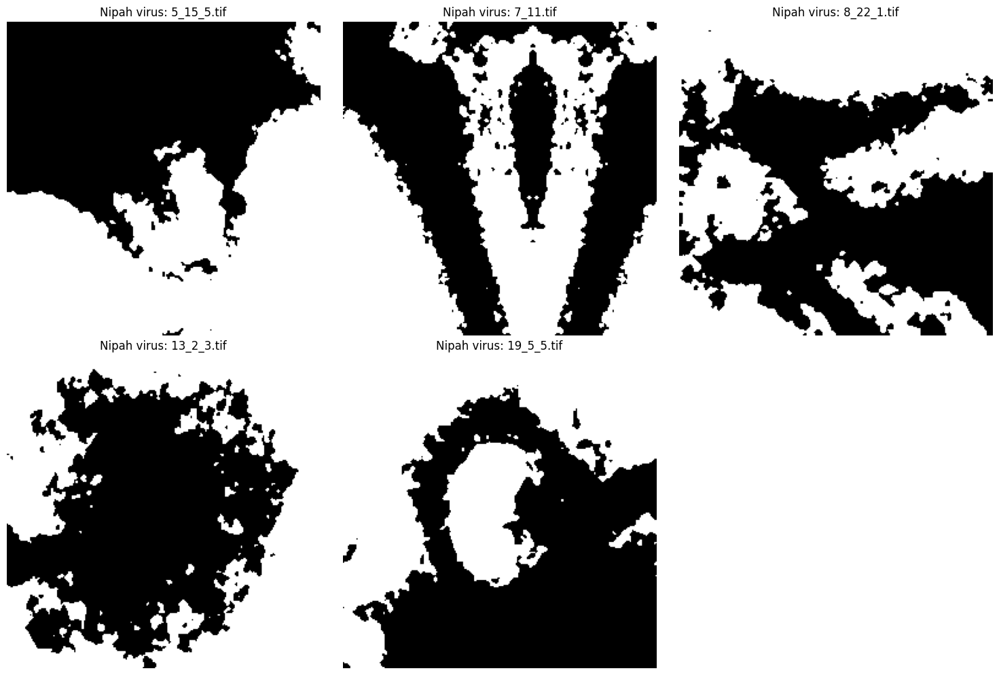

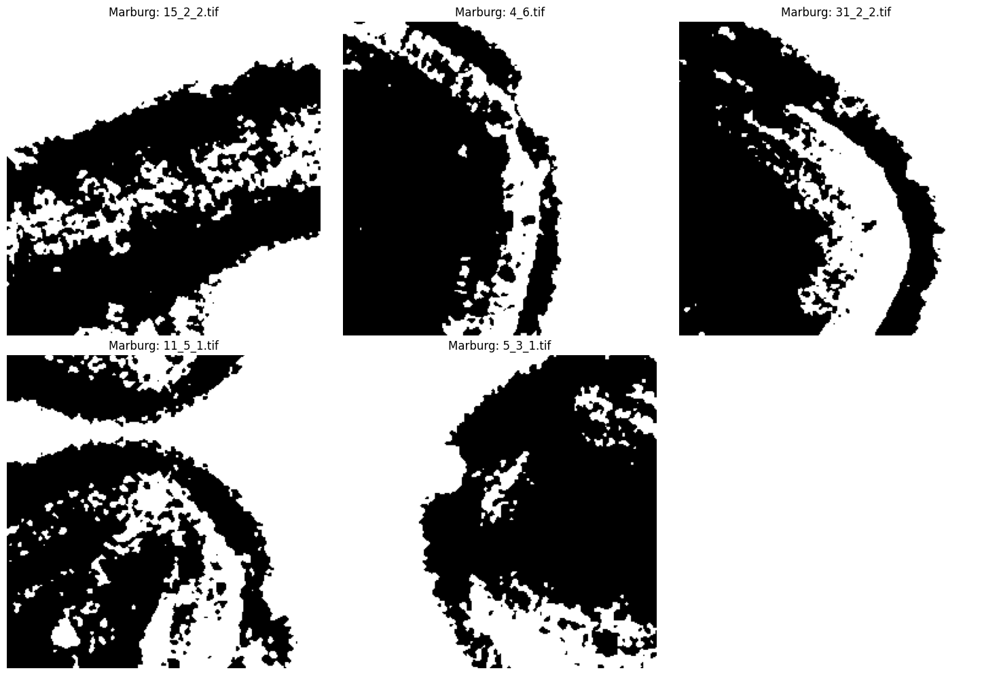

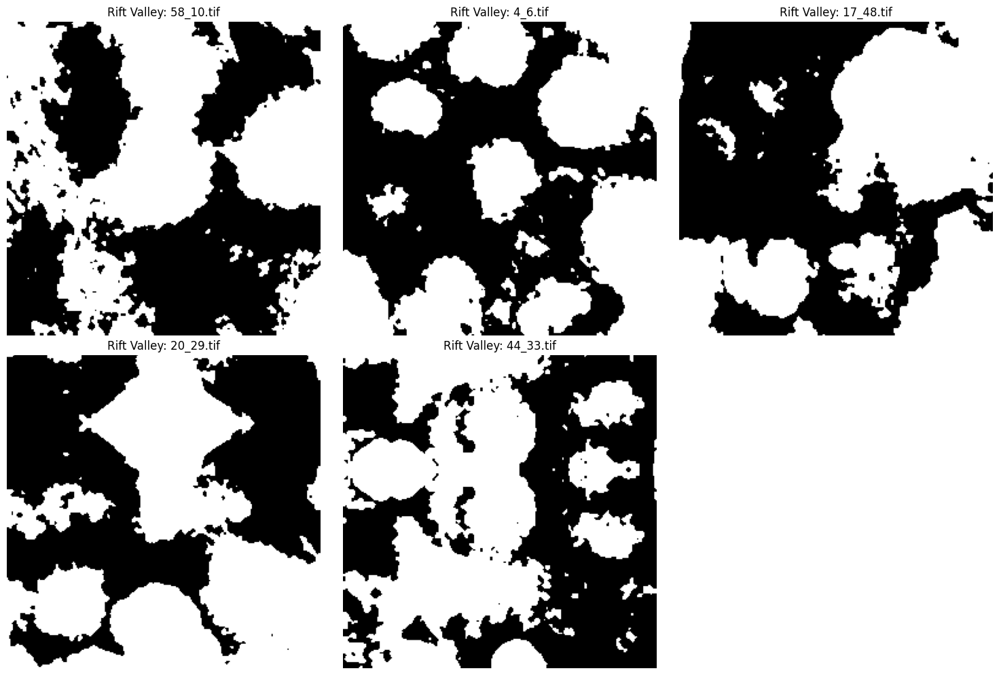

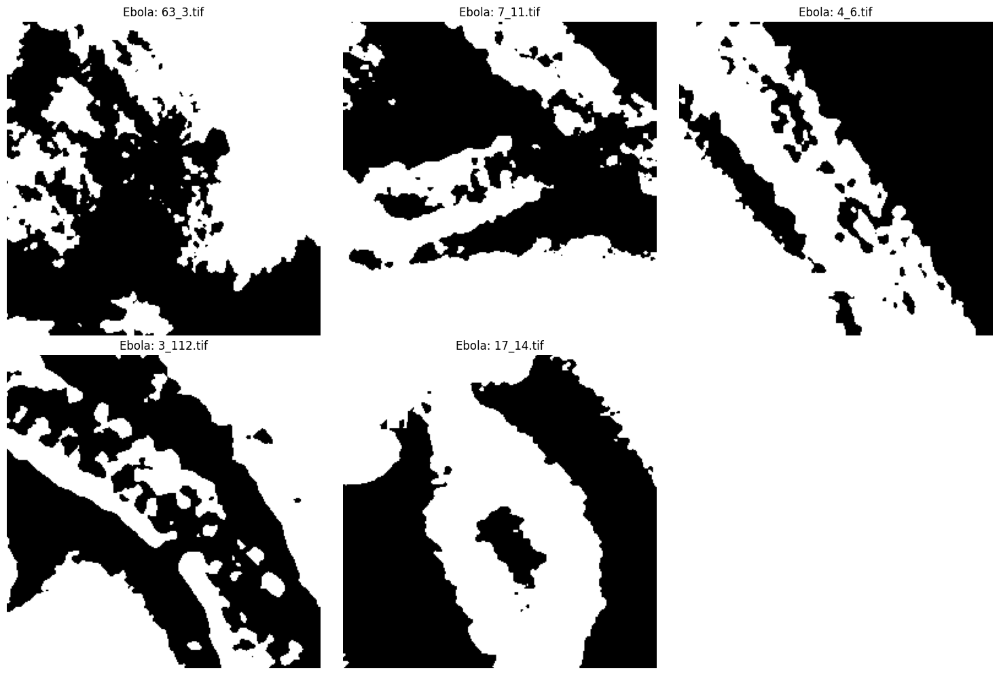

Image display completed.


In [ ]:
output_dir = '/content/proces/train'

class_names = [
    "Rotavirus", "Papilloma", "Influenza", "Adenovirus", "Lassa",
    "Orf", "CCHF", "Astrovirus", "Cowpox", "Norovirus",
    "Nipah virus", "Marburg", "Rift Valley", "Ebola"]

def display_images(class_name):
    class_output_dir = os.path.join(output_dir, class_name)
    images = os.listdir(class_output_dir)[:5]

    plt.figure(figsize=(15, 10))
    for i, img_name in enumerate(images):
        img_path = os.path.join(class_output_dir, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

        plt.subplot(2, 3, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f"{class_name}: {img_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

for class_name in class_names:
    display_images(class_name)

print("Image display completed.")


<font color='#EADCA0'><h2>Directory Setup for Image Data</h2></font>


In [ ]:
train_dir = "/content/process/train"
test_dir = "/content/process/test"
val_dir = "/content/process/val"

<font color='#EADCA0'><h2>Image Data Generators:</h2></font>
###### <font color='#E1CD76'>
used to preprocess and augment the image data
</font>

In [ ]:
train_gen = ImageDataGenerator( rescale= 1. / 255)
test_gen = ImageDataGenerator(rescale = 1. / 255)
val_gen = ImageDataGenerator(rescale = 1. / 255)

<font color='#EADCA0'><h2>Data Generators for Training, Testing, and Validation</h2></font>


In [ ]:
train_generator = train_gen.flow_from_directory(
    train_dir,
    target_size=(299, 299),
    batch_size = 128,
    class_mode='sparse'
)
print(train_generator.class_indices)

Found 10326 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


In [ ]:
test_generator = test_gen.flow_from_directory(
    test_dir,
    target_size=(299, 299),
    batch_size = 128,
    class_mode = 'sparse'
)
print(test_generator.class_indices)

Found 3454 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


In [ ]:
val_generator = val_gen.flow_from_directory(
    val_dir,
    target_size=(299, 299),
    batch_size = 128,
    class_mode = 'sparse'
)
print(val_generator.class_indices)

Found 3437 images belonging to 14 classes.
{'Adenovirus': 0, 'Astrovirus': 1, 'CCHF': 2, 'Cowpox': 3, 'Ebola': 4, 'Influenza': 5, 'Lassa': 6, 'Marburg': 7, 'Nipah virus': 8, 'Norovirus': 9, 'Orf': 10, 'Papilloma': 11, 'Rift Valley': 12, 'Rotavirus': 13}


<font color='#EADCA0'><h2>Model Architecture Setup</h2></font>
###### <font color='#E1CD76'>
1. Base Model: The Xception model is loaded, pre-trained on ImageNet, excluding the top classification layers (`include_top=False`) to allow for customization.<br>
2. Freezing Layers: Initially, all layers in the base model are frozen (`layer.trainable = False`) to retain pre-trained weights.<br>
3. Fine-tuning: The last 10 layers of the base model are unfrozen and made trainable to adapt the model to the dataset.<br>

</font>

In [ ]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-10:]:
    layer.trainable = True

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
base_model.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization  

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 5,496,320 (20.97 MB)

 Non-trainable params: 15,365,160 (58.61 MB)

In [ ]:
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(128, activation='relu')(x)
predictions = layers.Dense(14, activation='softmax')(x)


<font color='#EADCA0'><h2>Model Compilation</h2></font>
###### <font color='#E1CD76'>
1. Optimizer: The Adam optimizer is used with a learning rate of 1e-4.<br>
2. Loss Function: Sparse categorical crossentropy is applied for multi-class classification.<br>
3.Metrics: Accuracy is used as the performance metric during model training and evaluation.<br>

</font>

In [ ]:
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 299, 299, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization  

 Total params: 22,076,598 (84.22 MB)

 Trainable params: 6,711,438 (25.60 MB)

 Non-trainable params: 15,365,160 (58.61 MB)

<font color='#EADCA0'><h2>Class Weights Calculation</h2></font>
###### <font color='#E1CD76'>
1. **Class Indices**: Extracted from the training generator to map class labels to numerical indices.<br>
2. **Training Labels**: Obtained directly from the training generator to identify the labels of all images in the training set.<br>
3. **Class Weights**: Calculated using the `compute_class_weight` function with the `balanced` strategy to handle class imbalance. The weights are converted to a dictionary for use during training.<br>

</font>


In [ ]:
class_indices = train_generator.class_indices
class_labels = list(class_indices.keys())

train_labels = train_generator.classes

class_weights = compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights_dict = dict(enumerate(class_weights))

print("Class Labels:", class_labels)
print("Class Weights:", class_weights_dict)

<font color='#EADCA0'><h2>Callback Definitions</h2></font>
###### <font color='#E1CD76'>
1. **Checkpoint - Full Model**: Saves the entire model (`xception.keras`) when validation loss improves, ensuring the best-performing model is preserved.<br>
2. **Checkpoint - Weights Only**: Saves only the model weights (`xception.weights.h5`) when validation loss improves, for lightweight storage of the best model state.<br>
3. **Early Stopping**: Monitors validation loss and stops training if it doesn't improve for 15 epochs, restoring the best weights for further use.<br>

</font>

In [ ]:
checkpoint_full_model = ModelCheckpoint(
    filepath='xception.keras',
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

checkpoint_weights_only = ModelCheckpoint(
    filepath='xception.weights.h5',
    save_weights_only=True,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True, verbose=1)


Class Labels: ['Adenovirus', 'Astrovirus', 'CCHF', 'Cowpox', 'Ebola', 'Influenza', 'Lassa', 'Marburg', 'Nipah virus', 'Norovirus', 'Orf', 'Papilloma', 'Rift Valley', 'Rotavirus']
Class Weights: {0: 1.1954156054642278, 1: 1.0597290640394088, 2: 1.0783208020050126, 3: 1.2231698649609097, 4: 0.8353017311114707, 5: 0.8177066835603422, 6: 0.9704887218045113, 7: 0.8546598245323622, 8: 1.3054361567635904, 9: 1.075177009579342, 10: 1.2985412474849094, 11: 0.8017080745341615, 12: 0.7465297860034702, 13: 1.2480058013052937}


<font color='#EADCA0'><h2>Model Training</h2></font>

In [ ]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=120,
    callbacks=[checkpoint_full_model, checkpoint_weights_only, early_stopping],
    class_weight=class_weights_dict
)


Epoch 1/120


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2343 - loss: 2.3748
Epoch 1: val_loss improved from inf to 1.19802, saving model to xception.keras

Epoch 1: val_loss improved from inf to 1.19802, saving model to xception.weights.h5
81/81 ━━━━━━━━━━━━━━━━━━━━ 334s 3s/step - accuracy: 0.2361 - loss: 2.3704 - val_accuracy: 0.6802 - val_loss: 1.1980
Epoch 2/120
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6616 - loss: 1.0790
Epoch 2: val_loss improved from 1.19802 to 0.55224, saving model to xception.keras

Epoch 2: val_loss improved from 1.19802 to 0.55224, saving model to xception.weights.h5
81/81 ━━━━━━━━━━━━━━━━━━━━ 182s 2s/step - accuracy: 0.6622 - loss: 1.0771 - val_accuracy: 0.8211 - val_loss: 0.5522
Epoch 3/120
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8136 - loss: 0.5853
Epoch 3: val_loss improved from 0.55224 to 0.36982, saving model to xception.keras

Epoch 3: val_loss improved from 0.55224 to 0.36982, saving model to xception.weights.h5
81/81 ━━━━━━━━━━━━━━

<font color='#EADCA0'><h2>Model Evaluation</h2></font>
###### <font color='#E1CD76'>
1. **Evaluation Metrics**:
   - The model is evaluated on the training, testing, and validation datasets using `model.evaluate` to calculate loss and accuracy.<br>
   - Results are rounded and displayed for easier interpretation:<br>
      - Train Loss and Accuracy<br>
      - Test Loss and Accuracy<br>
      - Validation Loss and Accuracy<br>
      
</font>

In [ ]:
train_result = model.evaluate(train_generator)
test_result = model.evaluate(test_generator)
val_result = model.evaluate (val_generator)

81/81 ━━━━━━━━━━━━━━━━━━━━ 80s 988ms/step - accuracy: 0.9772 - loss: 0.0653
27/27 ━━━━━━━━━━━━━━━━━━━━ 92s 3s/step - accuracy: 0.9559 - loss: 0.1471
27/27 ━━━━━━━━━━━━━━━━━━━━ 27s 967ms/step - accuracy: 0.9574 - loss: 0.1354


In [ ]:
print('Train loss:', (np.round(train_result[0], 4)))
print('Test loss:', (np.round(test_result[0], 4)))
print('Val loss:', (np.round(val_result[0], 4)))

print('Train accuracy:', (np.round(train_result[1], 4) * 100) , '%')
print('Test accuracy:', (np.round(test_result[1], 4) * 100) , '%')
print('Val accuracy:', (np.round(val_result[1], 4) * 100) , '%')


Train loss: 0.063
Test loss: 0.1444
Val loss: 0.1574
Train accuracy: 97.72 %
Test accuracy: 95.66 %
Val accuracy: 95.55 %


<font color='#EADCA0'><h2>Learning Curve Visualization</h2></font>
###### <font color='#E1CD76'>
1. **Accuracy and Loss**:
   - Training and validation accuracy/loss metrics are extracted from the training history.<br>
   - Plots display trends over epochs to visualize model performance.<br>
   - Each point on the graph represents accuracy/loss for training and validation, providing insights into overfitting or underfitting.<br>
</font>

In [ ]:
def plot_learning_curve(history, metrics):
    acc = history.history[metrics]
    val_acc = history.history[f'val_{metrics}']
    epochs = range(len(acc))

    plt.figure(figsize=(8,5))
    plt.plot(epochs, acc, label=f'training_{metrics}')
    plt.plot(epochs, val_acc, label=f'val_{metrics}')
    plt.scatter(epochs, acc, color='blue')
    plt.scatter(epochs, val_acc, color='blue')
    plt.grid(True, color='gray')
    plt.legend()
    plt.show()

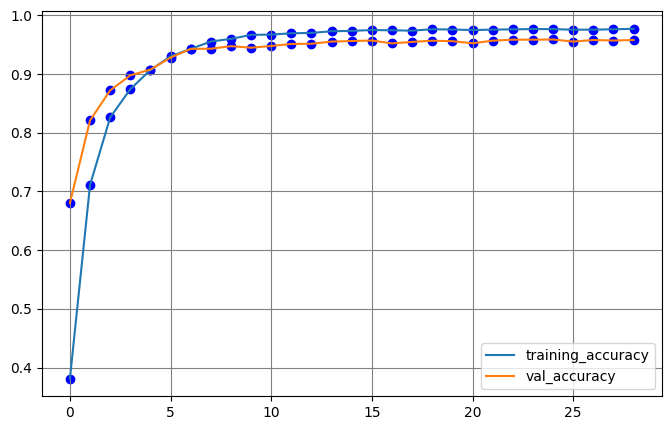

In [ ]:
plot_learning_curve(history=history, metrics='accuracy')

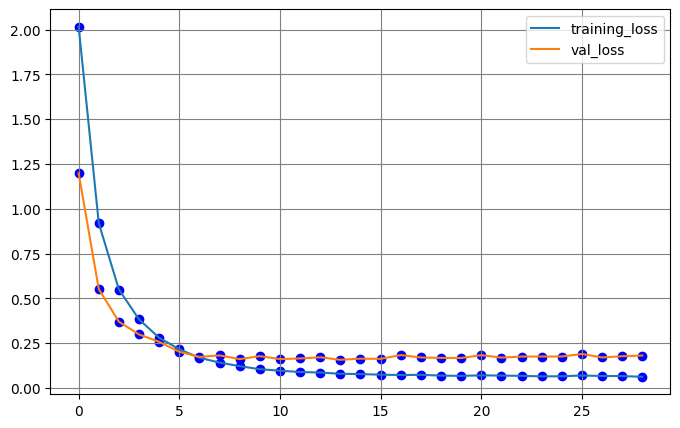

In [ ]:
plot_learning_curve(history=history, metrics='loss')

<font color='#EADCA0'><h2>Classification Report and Confusion Matrix</h2></font>
###### <font color='#E1CD76'>
1. **Batch-wise Evaluation**:
   - The test generator is iterated batch by batch to obtain predictions and true labels.<br>
   - Predictions are compared to ground truth to generate classification reports and confusion matrices for each batch (optional).<br>
2. **Overall Metrics**:
   - Predictions and labels from all batches are concatenated.<br>
   - Overall classification report and confusion matrix are computed:<br>
      - **Classification Report**: Displays precision, recall, F1-score, and support for each class.<br>
      - **Confusion Matrix**: Shows counts of true positive, true negative, false positive, and false negative predictions.<br>
3. **Confusion Matrix Visualization**:
   - Heatmap representation of the confusion matrix using `seaborn` for intuitive insights.<br>
   - True labels and predicted labels are annotated for better understanding.<br>
   
</font>

4/4 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━

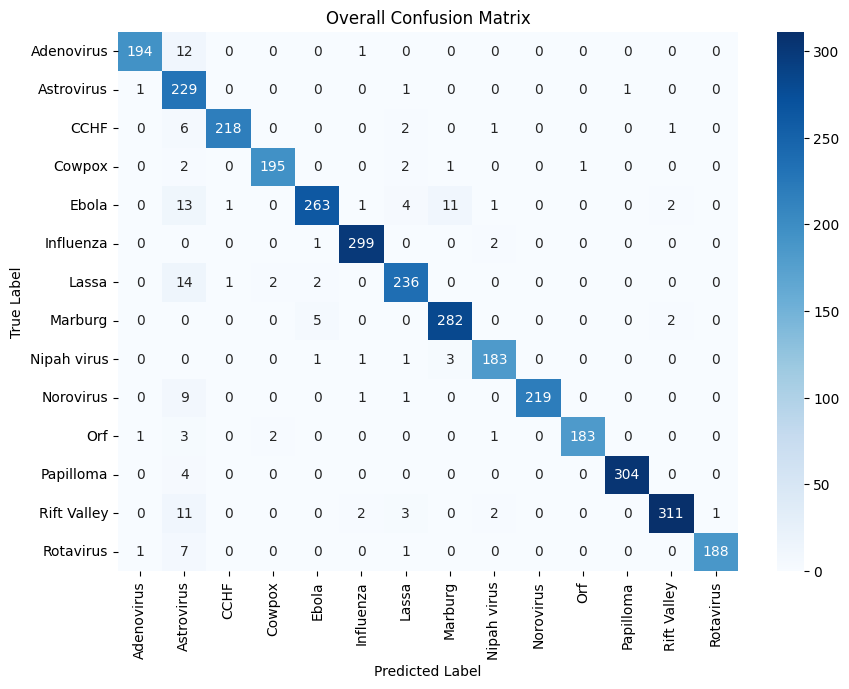

In [ ]:
test_predicts = []
test_targets = []

for batch_index, (x_test, y_test) in enumerate(test_generator):
    if batch_index >= len(test_generator):
        break

    test_predict = model.predict(x_test)

    batch_predicts = test_predict.argmax(axis=1)
    batch_targets = y_test
    test_predicts.append(batch_predicts)
    test_targets.append(batch_targets)

test_predicts = np.concatenate(test_predicts)
test_targets = np.concatenate(test_targets)

print("Overall Classification Report:")
print(classification_report(test_targets, test_predicts))

overall_cm = confusion_matrix(test_targets, test_predicts)
print("Overall Confusion Matrix:")
print(overall_cm)
class_names = list(test_generator.class_indices.keys())
plt.figure(figsize=(10, 7))
sns.heatmap(overall_cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names ,
            yticklabels=class_names )
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Overall Confusion Matrix')
plt.show()

<font color='#EADCA0'><h2>ROC Curve and AUC for Multi-Class Classification</h2></font>
###### <font color='#E1CD76'>
1. **ROC Curve**:
   - True labels are binarized (one-hot encoded) for multi-class ROC computation.<br>
   - Predicted probabilities are used to compute false positive rates (FPR) and true positive rates (TPR) for each class.<br>
2. **AUC**:
   - Area Under Curve (AUC) is calculated for each class.<br>
   - ROC curves and their corresponding AUC scores are plotted for individual classes.<br>
   - A diagonal line (random guess) is included for reference.<br>
3. **Visualization**:
   - The ROC curve is plotted with proper labeling and grid customization.<br>
   
</font>

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 

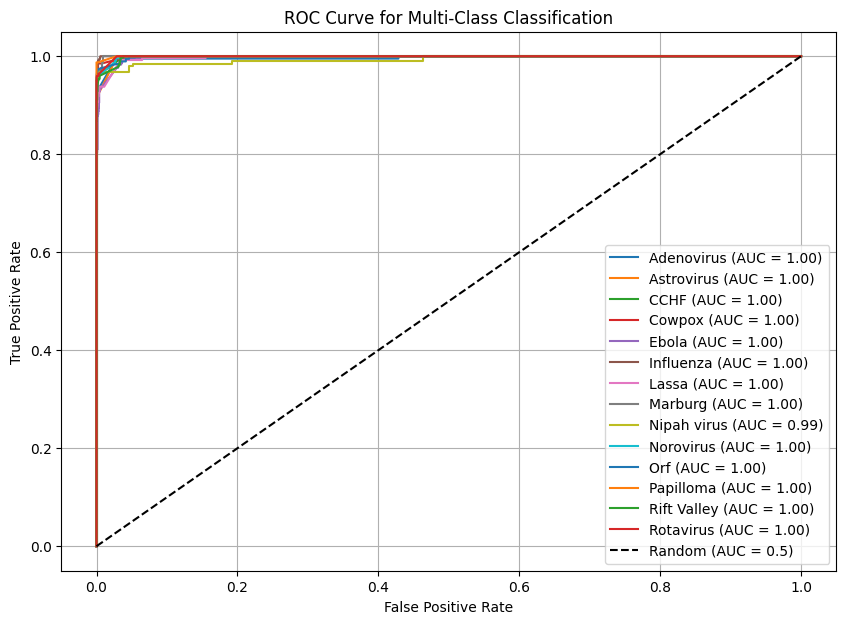

In [ ]:
test_predicts_proba = []
test_targets = []

for batch_index, (x_test, y_test) in enumerate(test_generator):
    if batch_index >= len(test_generator):
        break

    test_predict_proba = model.predict(x_test)

    batch_targets = y_test

    test_predicts_proba.append(test_predict_proba)
    test_targets.append(batch_targets)

test_predicts_proba = np.concatenate(test_predicts_proba)
test_targets = np.concatenate(test_targets)

lb = LabelBinarizer()
test_targets_binarized = lb.fit_transform(test_targets)

plt.figure(figsize=(10, 7))

class_names = list(test_generator.class_indices.keys())

for i in range(len(class_names)):
    fpr, tpr, _ = roc_curve(test_targets_binarized[:, i], test_predicts_proba[:, i])
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.5)')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-Class Classification')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
model.save('Virus xception.h5')

<font color='#EADCA0'><h2>Grad-CAM Visualization</h2></font>

###### <font color='#E1CD76'>
1. **Model Save**:
   - Trained model is saved in H5 format (`Virus xception.h5`) for later use and inference.<br>
2. **Grad-CAM**:
   - Grad-CAM is utilized to highlight regions in input images that influence the model's predictions.<br>
   - **Steps**:
      - Identify the last convolutional layer in the model.<br>
      - Use gradient-based visualization to compute heatmaps for predicted classes.<br>
3. **Visualization of Results**:
   - Heatmap is overlaid on the original image to highlight class-specific activation regions.<br>
   - Original image, heatmap, and overlayed image are displayed side by side for each sample.<br>
4. **Sampling and Display**:
   - A random sample of images from each class in the test dataset is used.<br>
   - Results include:
      - **Original Image**: Unaltered input.<br>
      - **Grad-CAM Heatmap**: Model's activation highlights.<br>
      - **Overlayed Image**: Combined visualization of input and heatmap.<br>
   - Grad-CAM results help interpret and explain model decisions.<br>
   
</font>

In [ ]:
model = tf.keras.models.load_model('/content/Virus xception.h5')

last_conv_layer = model.get_layer('block14_sepconv2')

grad_model = Model(inputs=model.inputs,
                   outputs=[last_conv_layer.output, model.output])


In [ ]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(299, 299))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

def generate_grad_cam(model, img_array, predicted_class):
    last_conv_layer = model.get_layer('block14_sepconv2_act')
    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)

        if isinstance(predictions, list):
            predictions = predictions[0]

        print(f"Predictions shape: {predictions.shape}")

        if predicted_class < predictions.shape[1]:
            loss = predictions[0, predicted_class]
        else:
            raise ValueError(f"predicted_class {predicted_class} is out of bounds for predictions shape {predictions.shape}.")

    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = heatmap.numpy()

    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)

    print(f"Generated heatmap shape: {heatmap.shape}")

    return heatmap


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predictions shape: (1, 14)
Generated heatmap shape: (10, 10)
1/1 ━━━━━━

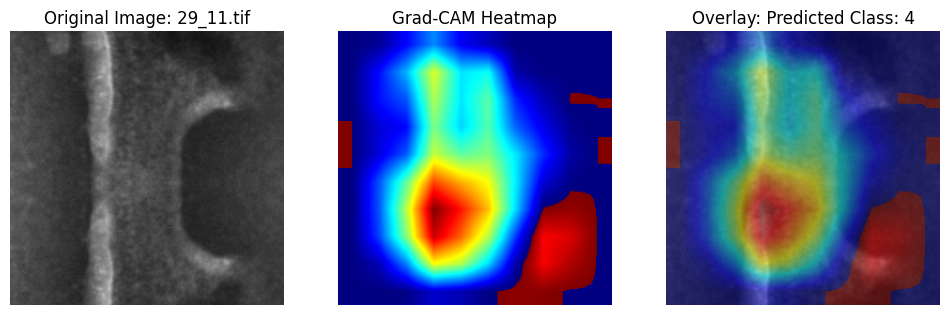

Image: 29_11.tif, Predicted Class: 4, Link: /content/process/test/Ebola/29_11.tif


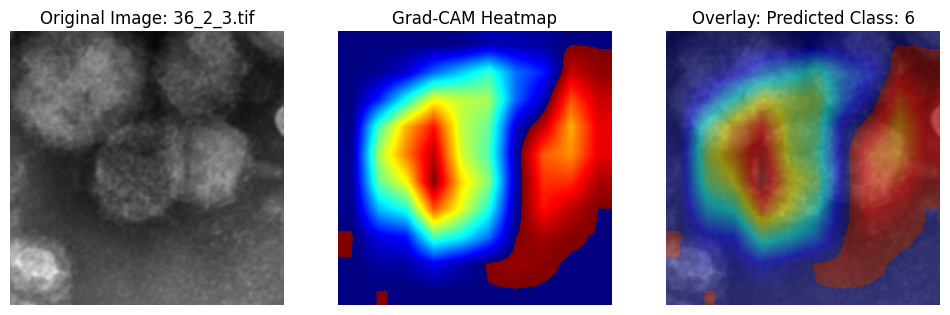

Image: 36_2_3.tif, Predicted Class: 6, Link: /content/process/test/Lassa/36_2_3.tif


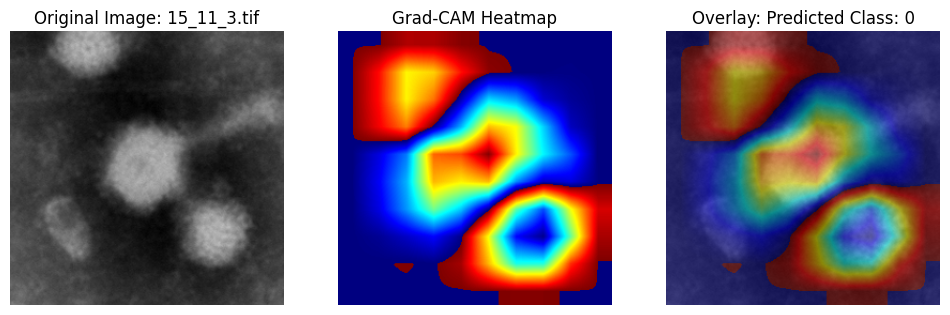

Image: 15_11_3.tif, Predicted Class: 0, Link: /content/process/test/Rotavirus/15_11_3.tif


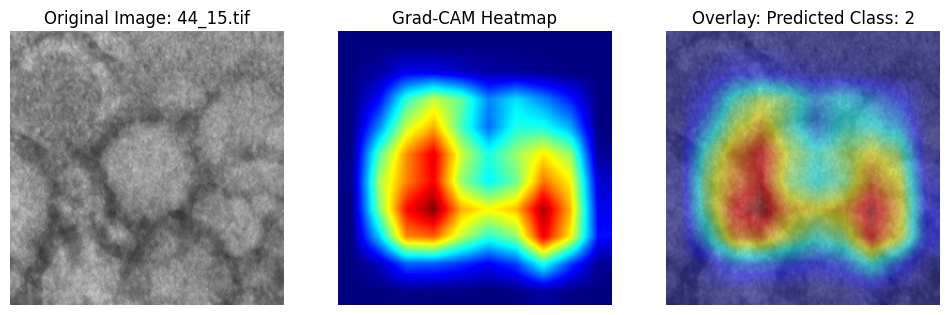

Image: 44_15.tif, Predicted Class: 2, Link: /content/process/test/CCHF/44_15.tif


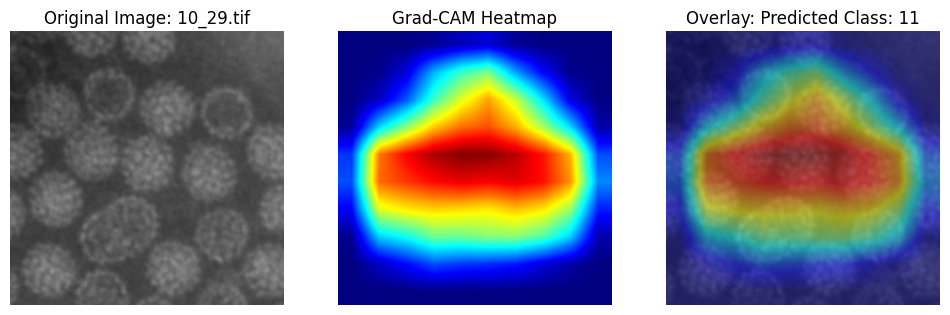

Image: 10_29.tif, Predicted Class: 11, Link: /content/process/test/Papilloma/10_29.tif


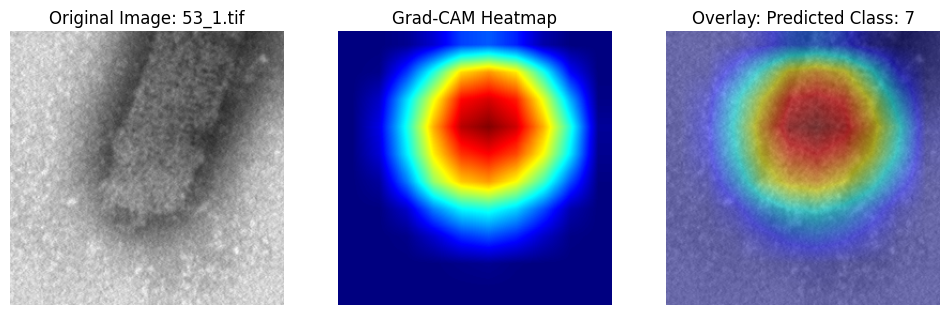

Image: 53_1.tif, Predicted Class: 7, Link: /content/process/test/Marburg/53_1.tif


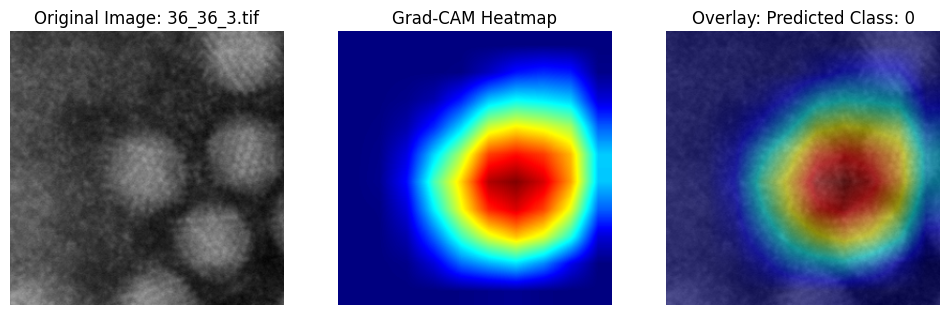

Image: 36_36_3.tif, Predicted Class: 0, Link: /content/process/test/Adenovirus/36_36_3.tif


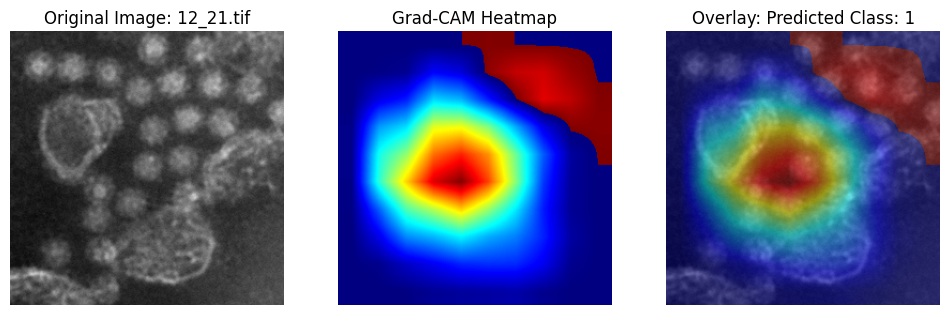

Image: 12_21.tif, Predicted Class: 1, Link: /content/process/test/Astrovirus/12_21.tif


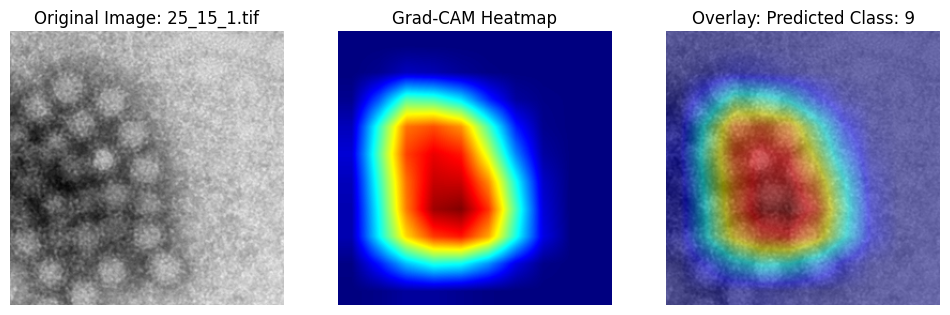

Image: 25_15_1.tif, Predicted Class: 9, Link: /content/process/test/Norovirus/25_15_1.tif


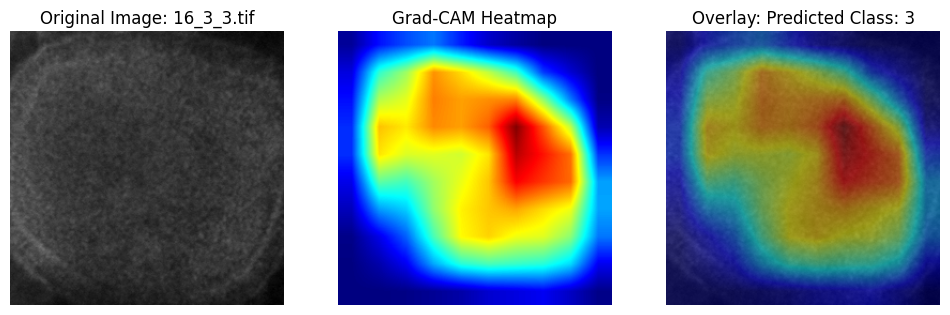

Image: 16_3_3.tif, Predicted Class: 3, Link: /content/process/test/Cowpox/16_3_3.tif


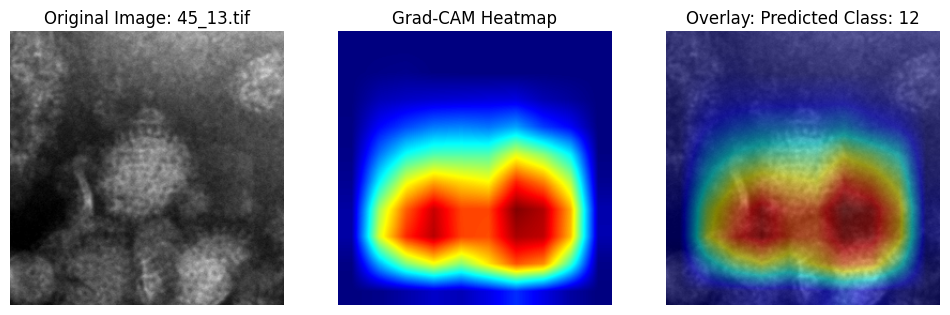

Image: 45_13.tif, Predicted Class: 12, Link: /content/process/test/Rift Valley/45_13.tif


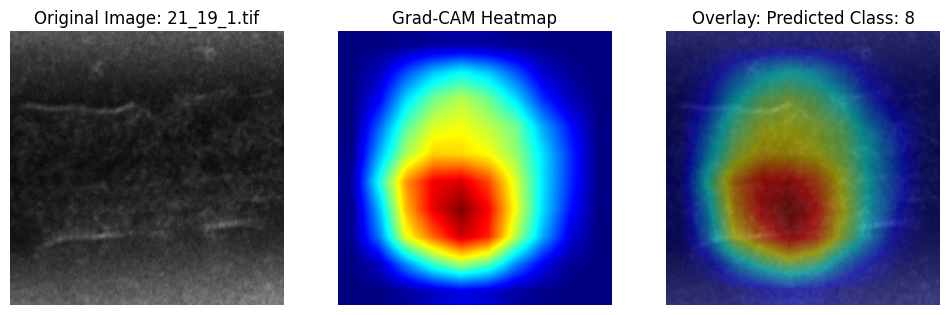

Image: 21_19_1.tif, Predicted Class: 8, Link: /content/process/test/Nipah virus/21_19_1.tif


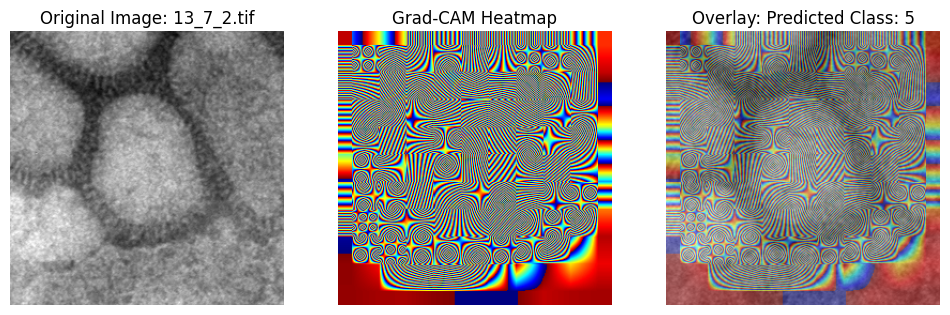

Image: 13_7_2.tif, Predicted Class: 5, Link: /content/process/test/Influenza/13_7_2.tif


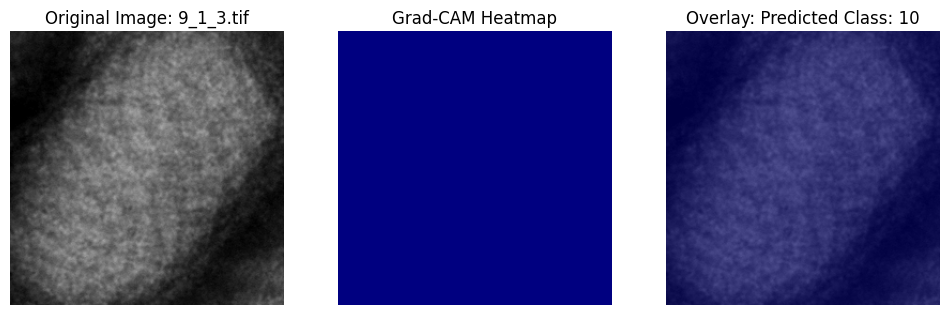

Image: 9_1_3.tif, Predicted Class: 10, Link: /content/process/test/Orf/9_1_3.tif


In [ ]:
test_images_dir = '/content/process/test'

class_dirs = [d for d in os.listdir(test_images_dir) if os.path.isdir(os.path.join(test_images_dir, d))]

sample_size = 1
results = []

for class_dir in class_dirs:
    class_path = os.path.join(test_images_dir, class_dir)

    image_files = [f for f in os.listdir(class_path) if f.endswith('.tif')]
    sampled_files = random.sample(image_files, min(sample_size, len(image_files)))

    for filename in sampled_files:
        image_path = os.path.join(class_path, filename)
        img_array = preprocess_image(image_path)

        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions[0])

        heatmap = generate_grad_cam(model, img_array, predicted_class)

        original_image = load_img(image_path)

        if isinstance(heatmap, np.ndarray):
            heatmap_resized = cv2.resize(heatmap, (original_image.size[0], original_image.size[1]))
            heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)

            heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
        else:
            raise ValueError(f"Heatmap is not a valid numpy array: {type(heatmap)}")

        original_image_np = img_to_array(original_image) / 255.0
        heatmap_color_float = heatmap_color.astype(np.float32) / 255.0

        overlayed_image = cv2.addWeighted(heatmap_color_float, 0.5, original_image_np, 0.5, 0)

        results.append((filename, predicted_class, image_path, original_image, overlayed_image, heatmap_color))

for filename, predicted_class, image_link, original_image, overlayed_image, heatmap_color in results:
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title(f'Original Image: {filename}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_color)
    plt.title('Grad-CAM Heatmap')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlayed_image)
    plt.title(f'Overlay: Predicted Class: {predicted_class}')
    plt.axis('off')

    plt.show()

    print(f'Image: {filename}, Predicted Class: {predicted_class}, Link: {image_link}')
